### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from keras.datasets import mnist # MNIST dataset is included in Keras


### Load Dataset

In [2]:
# The MNIST data is split between 60,000 training images and 10,000 test image
(X_train, y_train), (X_test, y_test) = mnist.load_data()

print("X_train shape", X_train.shape)
print("y_train shape", y_train.shape)
print("X_test shape", X_test.shape)
print("y_test shape", y_test.shape)

X_train shape (60000, 28, 28)
y_train shape (60000,)
X_test shape (10000, 28, 28)
y_test shape (10000,)


### Display Mnist Data

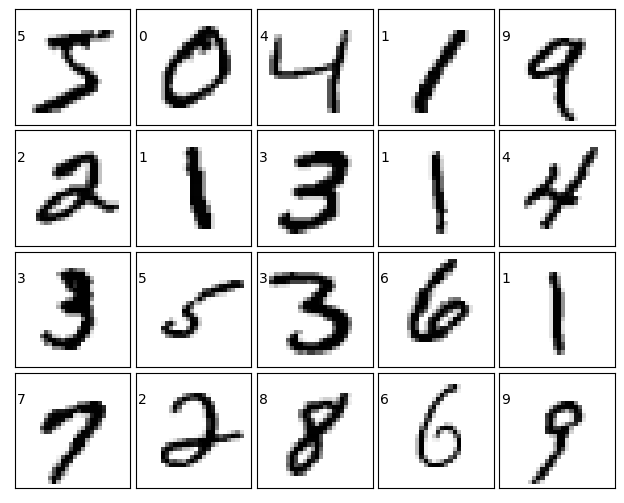

In [3]:
fig = plt.figure(figsize=(6, 6))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

for i in range(20):
    ax = fig.add_subplot(5, 5, i + 1, xticks=[], yticks=[])
    ax.imshow(X_train[i], cmap=plt.cm.binary, interpolation='nearest')
    # label the image with the target value
    ax.text(0, 7, str(y_train[i]))


### Preprocessing Data

In [4]:
# Reshaping the dataset  60000*768
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1]**2) 

# Change integers to 32-bit floating point numbers
X_train = X_train.astype('float32')   

print("Training matrix shape", X_train.shape)

Training matrix shape (60000, 784)


In [5]:
# Apply standarization to both train and test data
from sklearn.preprocessing import StandardScaler
X_train = StandardScaler().fit_transform(X_train)

In [6]:
print(f"After standarization mean = {X_train.mean().round() }")
print(f"After standarization variance = {X_train.var().round()}")

After standarization mean = -0.0
After standarization variance = 1.0


### PCA 

In [7]:
# initializing the pca
from sklearn.decomposition import PCA

In [8]:
pca = PCA(n_components=2)
pca.fit(X_train)

PCA(n_components=2)

In [9]:
train_img = pca.transform(X_train)

print(f'train_img shape : {train_img.shape}')

train_img shape : (60000, 2)


In [10]:
print(f"Explained variance by the 2 components : {pca.explained_variance_ }")
print(f"Explained variance by the 2 components (sum ) : { pca.explained_variance_.sum()}")

Explained variance by the 2 components : [40.487656 29.241741]
Explained variance by the 2 components (sum ) : 69.72940063476562


### Visualization 

In [11]:
import pandas as pd
df = pd.DataFrame(train_img, columns = ['pca_1', 'pca_2'])

In [12]:
df['label' ] = y_train

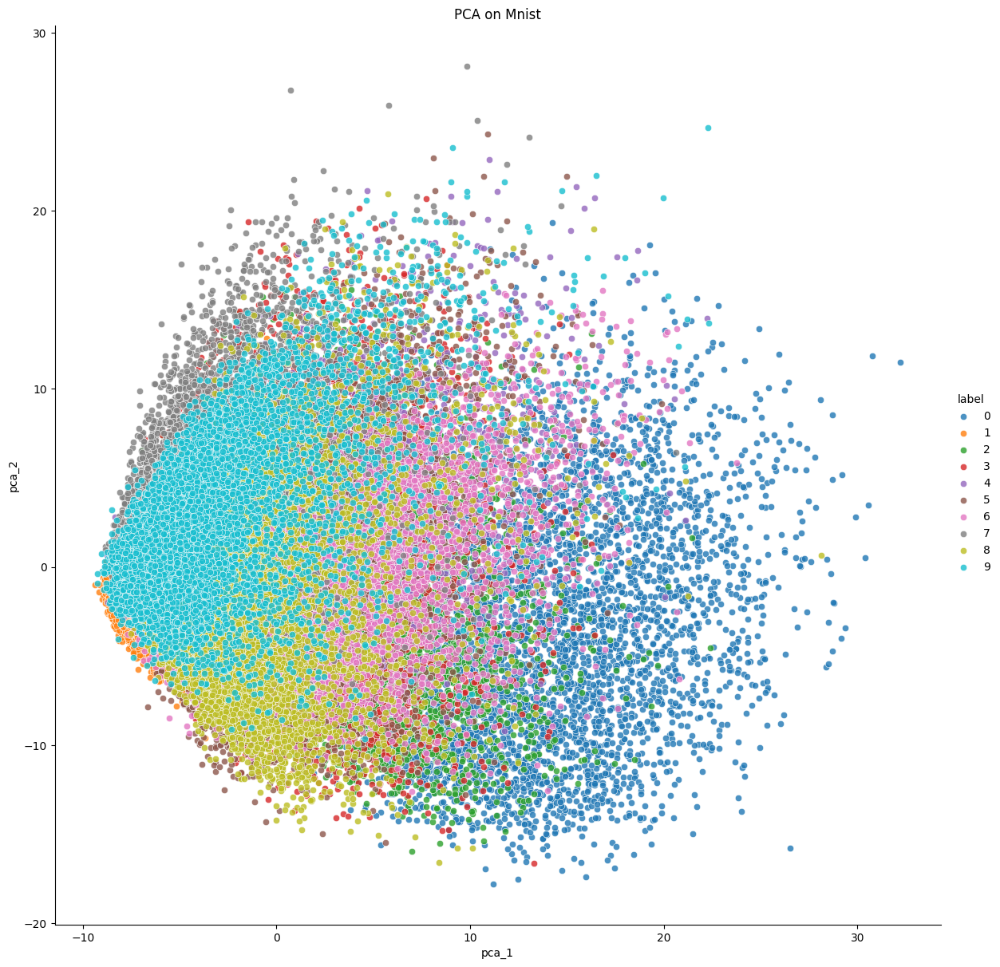

In [13]:

fig = sns.FacetGrid(df, hue = 'label', height = 12)
fig.map(sns.scatterplot, 'pca_1', 'pca_2', alpha = 0.8)
fig.add_legend()
fig.set(title = "PCA on Mnist")
plt.show()


### Observation

    1. There is some separation between 0(dark blue), 6(pink), 9(cyan)
    2. However, there is significant overlap observed between the different classes, indicating that they are not well 
    separated from each other.

### Using 3 components 

In [14]:
pca = PCA(n_components=3)
pca.fit(X_train)

PCA(n_components=3)

In [15]:
train_img = pca.transform(X_train)

print(f'train_img shape : {train_img.shape}')

train_img shape : (60000, 3)


In [16]:
print(f"Explained variance by the 2 components : {pca.explained_variance_ }")
print(f"Explained variance by the 2 components (sum ) : { pca.explained_variance_.sum()}")

Explained variance by the 2 components : [40.487617 29.241644 26.811796]
Explained variance by the 2 components (sum ) : 96.54106140136719


### Visualization 

In [17]:
import pandas as pd
df = pd.DataFrame(train_img, columns = ['pca_1', 'pca_2', 'pca_3'])
df['label' ] = y_train

In [18]:
import plotly.express as px

fig = px.scatter_3d(df, x='pca_1', y='pca_2', z='pca_3',
              color='label')
fig.update_traces(marker_size = 5)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

### Observation

    1. Some separation can be noticed easily.